# Мартьянова Александра Евгеньевна, курс «Data Science», ВКР

### Кластеризация параметров

#### 1. Загрузка и подготовка датасета

In [1]:
# Загрузка разных библиотек
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering 
from scipy.cluster import hierarchy 
from scipy.spatial import distance_matrix 
from sklearn.metrics import silhouette_score
from fcmeans import FCM
import scipy.stats as stats
import statistics
from scipy.stats import f_oneway

%matplotlib inline 

In [2]:
# Загрузка в объект DataFrame файла X_bp.xlsx, метод read_excel
x_bp = pd.read_excel('X_bp.xlsx', index_col = 0)
x_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [3]:
# Загрузка в объект DataFrame файла X_nup.xlsx, метод read_excel
x_nup = pd.read_excel('X_nup.xlsx', index_col = 0)
x_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.0,57.0
1.0,0.0,4.0,60.0
2.0,0.0,4.0,70.0
3.0,0.0,5.0,47.0
4.0,0.0,5.0,57.0


In [4]:
# соединение объектов DataFrame, метод merge, объединение по индексу, тип объединения INNER
df = x_bp.merge(x_nup, how = 'inner', left_index = True, right_index = True)
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [5]:
# Изменение типа данных индекса, метод astype('int')
df.index = df.index.astype('int')
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [6]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df.dtypes['Угол нашивки, град']

dtype('float64')

In [7]:
# Изменение типа данных и ранжировка переменной 'Угол нашивки, град', метод astype('int')
df = df.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
df['Угол нашивки, град'] = df['Угол нашивки, град'].astype(int)

In [8]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df.dtypes['Угол нашивки, град']

dtype('int32')

In [9]:
# Описательная статистика датасета df, метод describe()
df.describe(include='all')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901


In [10]:
# Вывод сведений о новом объекте DataFrame df_s, метод info()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int32  
 11  Шаг нашивки      

In [11]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [12]:
# Заменить названия столбцов таблицы методом set_axis()
df = df.set_axis(['МатрНап','Плотн','МодУпр','КолвОтвер','КолвЭпокс','ТемпВсп','ПовПлотн','МодУпрРаст','ПрочнРаст','КолвСмол','УголНаш','ШагНаш','ПлотнНаш'], axis = 'columns') 
df.head()

,МатрНап,Плотн,МодУпр,КолвОтвер,КолвЭпокс,ТемпВсп,ПовПлотн,МодУпрРаст,ПрочнРаст,КолвСмол,УголНаш,ШагНаш,ПлотнНаш
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [13]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

In [14]:
df_s = df.copy()

#### 2. Нормализация датасета

In [15]:
# Загрузка MinMaxScaler из библиотеки sklearn.preprocessing
from sklearn.preprocessing import MinMaxScaler

In [16]:
# Применение MinMaxScaler для нормализации датасета df
min_max_scaler = MinMaxScaler()
df = pd.DataFrame(min_max_scaler.fit_transform(df), columns = df.columns, index=df.index)

In [17]:
# Описательная статистика нормализованного датасета df
df.describe()

,МатрНап,Плотн,МодУпр,КолвОтвер,КолвЭпокс,ТемпВсп,ПовПлотн,МодУпрРаст,ПрочнРаст,КолвСмол,УголНаш,ШагНаш,ПлотнНаш
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,0.488427,0.512533,0.386301,0.512273,0.426215,0.593354,0.344638,0.497880,0.508634,0.484838,0.491691,0.477768,0.549616
std,0.175541,0.154890,0.172978,0.156147,0.128370,0.130695,0.201092,0.167435,0.172724,0.156875,0.500175,0.177519,0.118772
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.370696,0.404175,0.260652,0.412240,0.338919,0.507756,0.190296,0.386030,0.390881,0.382955,0.000000,0.351790,0.478890
50%,0.483912,0.516497,0.386165,0.512240,0.425487,0.593401,0.322574,0.494672,0.506003,0.486875,0.000000,0.478940,0.551423
75%,0.608045,0.608413,0.502528,0.618003,0.517842,0.679924,0.495105,0.606751,0.615432,0.587411,1.000000,0.594597,0.624537
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Прочность при растяжении, МПа

###### 8. Исключить из параметров 'МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш'

In [18]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

In [19]:
# Назначение переменной X
X = df.drop(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


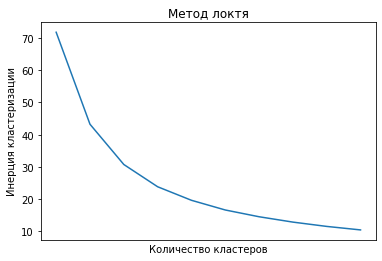

In [20]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [21]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

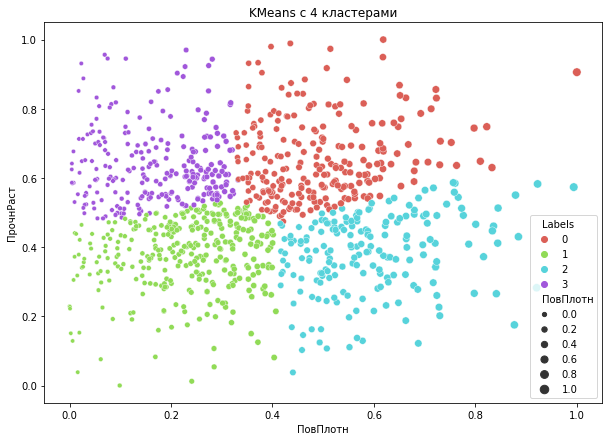

In [22]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=4).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['ПовПлотн'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ПовПлотн'], palette=sns.color_palette('hls', 4))

plt.title('KMeans c 4 кластерами')
plt.show()

In [23]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count()

(ПовПлотн     241
 ПрочнРаст    241
 Labels       241
 dtype: int64,
 ПовПлотн     331
 ПрочнРаст    331
 Labels       331
 dtype: int64,
 ПовПлотн     194
 ПрочнРаст    194
 Labels       194
 dtype: int64,
 ПовПлотн     257
 ПрочнРаст    257
 Labels       257
 dtype: int64)

In [24]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20),X[X['Labels']==3]['ПрочнРаст'].head(20)

(23     0.551464
 24     0.949223
 25     0.564512
 27     0.719231
 29     0.593114
 31     0.625957
 35     0.765150
 39     0.541612
 40     0.644347
 46     0.843247
 53     0.542289
 58     0.598115
 64     0.699905
 71     0.639752
 76     0.611853
 83     0.663560
 91     0.546588
 97     0.716389
 106    0.973223
 114    0.591770
 Name: ПрочнРаст, dtype: float64,
 7     0.271429
 8     0.271429
 12    0.504591
 13    0.504591
 14    0.504591
 17    0.271429
 18    0.271429
 21    0.504591
 22    0.504591
 30    0.502239
 33    0.450606
 36    0.303619
 42    0.421020
 44    0.436028
 45    0.214490
 50    0.348433
 51    0.377301
 52    0.497733
 54    0.456669
 59    0.343290
 Name: ПрочнРаст, dtype: float64,
 9      0.342563
 10     0.342563
 11     0.342563
 19     0.342563
 20     0.342563
 28     0.445341
 37     0.124386
 43     0.461906
 49     0.269906
 66     0.428445
 72     0.319201
 77     0.129287
 84     0.201768
 88     0.358228
 89     0.311637
 90     0.390078


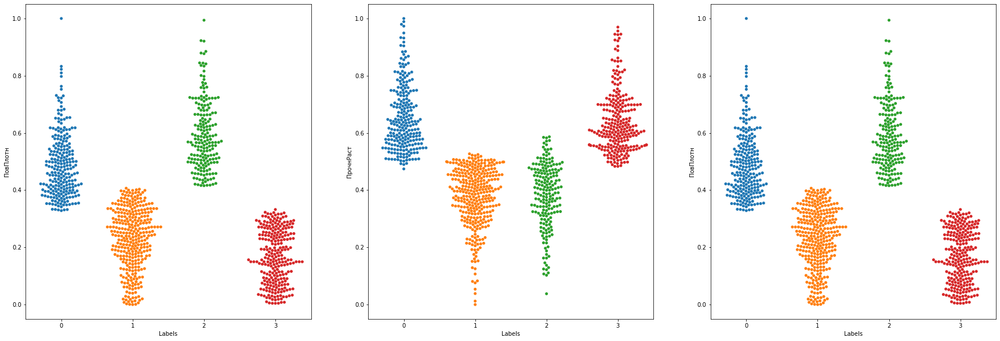

In [25]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='ПовПлотн', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='ПовПлотн', data=X, ax=ax)

plt.show()

In [26]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.33373259814708994


###### Иерархическая кластеризация (агломеративная)

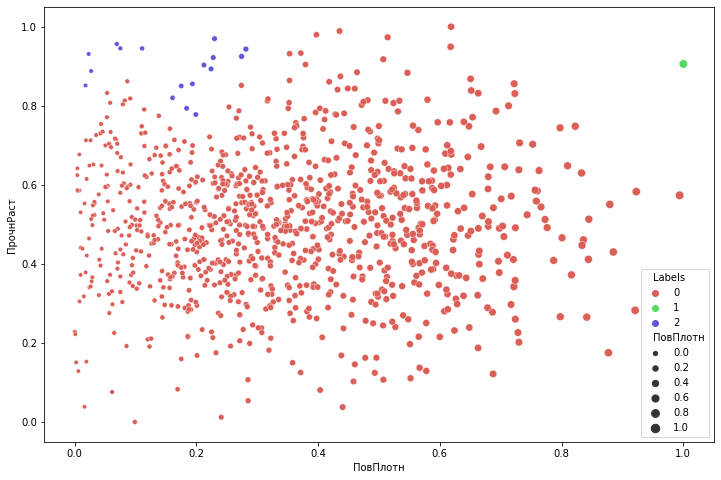

In [27]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=3, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['ПовПлотн'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ПовПлотн'],
                palette=sns.color_palette('hls', 3))
plt.show()

In [28]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count(),X[X['Labels']==5].count(),X[X['Labels']==6]['ПрочнРаст'].head(20),

(ПовПлотн     1005
 ПрочнРаст    1005
 Labels       1005
 dtype: int64,
 ПовПлотн     1
 ПрочнРаст    1
 Labels       1
 dtype: int64,
 ПовПлотн     17
 ПрочнРаст    17
 Labels       17
 dtype: int64,
 ПовПлотн     0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 ПовПлотн     0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 ПовПлотн     0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 Series([], Name: ПрочнРаст, dtype: float64))

In [29]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20),X[X['Labels']==3]['ПрочнРаст'].head(20),X[X['Labels']==4]['ПрочнРаст'].head(20),X[X['Labels']==5]['ПрочнРаст'].head(20),

(0     0.698235
 1     0.698235
 2     0.698235
 3     0.698235
 4     0.698235
 5     0.698235
 6     0.698235
 7     0.271429
 8     0.271429
 9     0.342563
 10    0.342563
 11    0.342563
 12    0.504591
 13    0.504591
 14    0.504591
 15    0.698235
 16    0.698235
 17    0.271429
 18    0.271429
 19    0.342563
 Name: ПрочнРаст, dtype: float64,
 692    0.905772
 Name: ПрочнРаст, dtype: float64,
 99      0.956165
 201     0.820160
 258     0.930999
 276     0.893163
 326     0.850222
 335     0.921909
 395     0.855358
 428     0.777766
 523     0.924760
 533     0.851505
 535     0.902956
 589     0.887811
 654     0.945177
 695     0.969771
 897     0.944956
 993     0.793434
 1008    0.943372
 Name: ПрочнРаст, dtype: float64,
 Series([], Name: ПрочнРаст, dtype: float64),
 Series([], Name: ПрочнРаст, dtype: float64),
 Series([], Name: ПрочнРаст, dtype: float64))

In [30]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.2554407445070297


In [31]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.         0.         ... 0.39747453 0.45181285 0.39557454]
 [0.         0.         0.         ... 0.39747453 0.45181285 0.39557454]
 [0.         0.         0.         ... 0.39747453 0.45181285 0.39557454]
 ...
 [0.39747453 0.39747453 0.39747453 ... 0.         0.22178502 0.07006881]
 [0.45181285 0.45181285 0.45181285 ... 0.22178502 0.         0.29138538]
 [0.39557454 0.39557454 0.39557454 ... 0.07006881 0.29138538 0.        ]]


In [32]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_17728\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


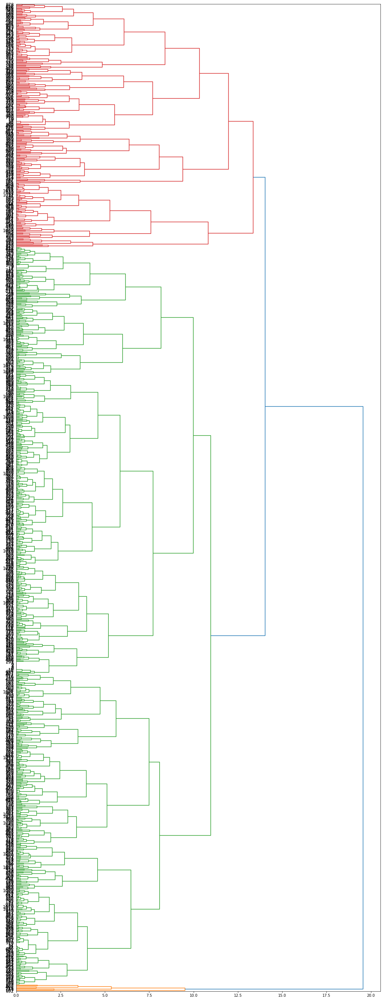

In [33]:
# dendrogram 
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

### DBSCAN

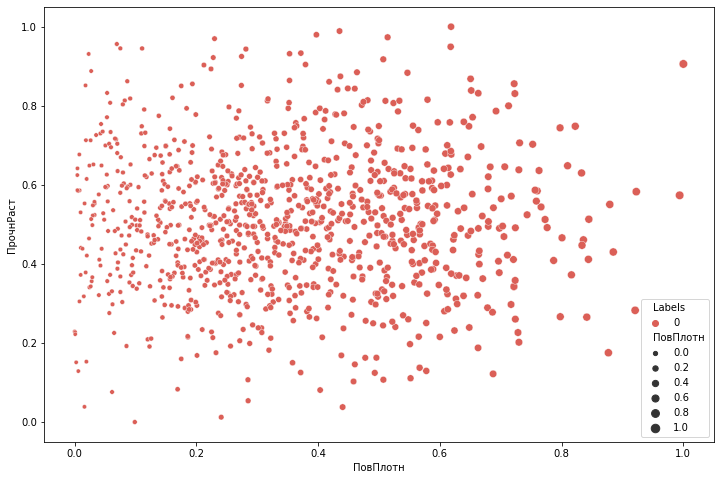

In [34]:
# кластеризация DBSCAN
from sklearn.cluster import DBSCAN 

db = DBSCAN(eps=100, min_samples=4).fit(X.drop(['Labels'], axis=1))

X['Labels'] = db.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['ПовПлотн'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ПовПлотн'],
                palette=sns.color_palette('hls', np.unique(db.labels_).shape[0]))
plt.show()

In [35]:
#print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

### C-means

In [36]:
# C-mean подобно KMeans показывает кластеризацию параметров
X.drop(['Labels'], axis=1, inplace=True)
fcm = FCM(n_clusters=4)
fcm.fit(X.values)

fcm_centers = fcm.centers
fcm_labels = fcm.predict(X.values) 

In [37]:
X['Labels'] = fcm_labels

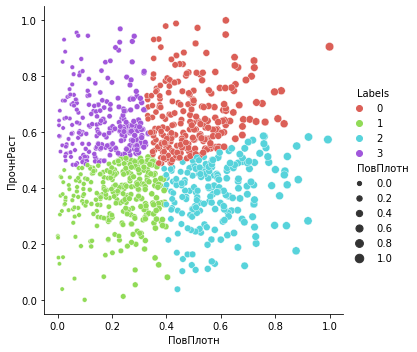

In [38]:
sns.relplot(x='ПовПлотн', y='ПрочнРаст', hue='Labels', 
            size='ПовПлотн', data=X, palette = sns.color_palette('hls', 4))

In [39]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count()

(ПовПлотн     241
 ПрочнРаст    241
 Labels       241
 dtype: int64,
 ПовПлотн     311
 ПрочнРаст    311
 Labels       311
 dtype: int64,
 ПовПлотн     205
 ПрочнРаст    205
 Labels       205
 dtype: int64,
 ПовПлотн     266
 ПрочнРаст    266
 Labels       266
 dtype: int64)

In [40]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20),X[X['Labels']==3]['ПрочнРаст'].head(20)

(23     0.551464
 24     0.949223
 25     0.564512
 27     0.719231
 29     0.593114
 31     0.625957
 35     0.765150
 39     0.541612
 40     0.644347
 46     0.843247
 53     0.542289
 58     0.598115
 64     0.699905
 71     0.639752
 76     0.611853
 83     0.663560
 91     0.546588
 97     0.716389
 106    0.973223
 114    0.591770
 Name: ПрочнРаст, dtype: float64,
 7     0.271429
 8     0.271429
 12    0.504591
 13    0.504591
 14    0.504591
 17    0.271429
 18    0.271429
 21    0.504591
 22    0.504591
 30    0.502239
 33    0.450606
 36    0.303619
 42    0.421020
 45    0.214490
 50    0.348433
 51    0.377301
 52    0.497733
 54    0.456669
 59    0.343290
 60    0.394141
 Name: ПрочнРаст, dtype: float64,
 9      0.342563
 10     0.342563
 11     0.342563
 19     0.342563
 20     0.342563
 28     0.445341
 37     0.124386
 43     0.461906
 44     0.436028
 49     0.269906
 66     0.428445
 72     0.319201
 77     0.129287
 84     0.201768
 88     0.358228
 89     0.311637


In [41]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.330168195096557


Проверка значимости различия по критерию Краскала-Уоллиса

In [42]:
# индексация кластеров
filter_0 = X[X['Labels']==0].index
filter_1 = X[X['Labels']==1].index
filter_2 = X[X['Labels']==2].index
filter_3 = X[X['Labels']==3].index

In [43]:
# выделение объектов np.array
df_0 = np.array(df_s['ПрочнРаст'][filter_0].reset_index(drop=True))
df_1 = np.array(df_s['ПрочнРаст'][filter_1].reset_index(drop=True))
df_2 = np.array(df_s['ПрочнРаст'][filter_2].reset_index(drop=True))
df_3 = np.array(df_s['ПрочнРаст'][filter_3].reset_index(drop=True))

In [44]:
# критерий Краскала-Уоллиса
stats.mstats.kruskalwallis(df_0,df_1,df_2,df_3)

KruskalResult(statistic=736.7889456671963, pvalue=2.2106151584373816e-159)

Вывод: различия по группам значимы для параметра 'ПрочнРаст'

Создание новых датасетов для обработки:

In [45]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df_s.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

In [46]:
ddf_0 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_0])
ddf_0.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_0.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,2.587348,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,80.803222,2587.342983,246.613117,1.0,4.000000,70.000000
1,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760,1.0,5.000000,47.000000
2,2.046471,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556,1.0,5.000000,57.000000
3,3.305535,1917.907506,478.286247,105.786930,17.874100,328.154579,526.692159,72.345709,3059.032991,275.575880,1.0,5.000000,70.000000
4,2.282825,2008.357592,393.967325,149.372832,21.661751,330.498641,535.371459,72.244924,2704.445081,261.077072,1.0,7.000000,57.000000
5,1.771436,1872.491560,801.033883,79.794548,22.296304,340.736898,864.929184,70.947592,2796.785402,123.356264,1.0,7.000000,70.000000
6,3.247617,1813.234600,757.874479,81.379871,23.422465,279.080157,575.062857,69.341133,3188.136358,252.870569,1.0,9.000000,70.000000
7,2.667697,2078.894676,1542.168458,132.147403,22.650109,357.972896,787.299217,76.471788,2559.643047,163.902778,1.0,10.000000,70.000000
8,3.034399,1968.401388,455.871019,61.421297,23.490723,316.414572,637.376893,75.090372,2848.490078,311.052398,0.0,7.856167,64.301964
9,2.338424,1963.351560,1155.160504,150.015830,18.299421,315.904178,644.363142,71.303990,3407.713581,304.423274,0.0,10.302945,39.234280


In [47]:
ddf_1 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_1])
ddf_1.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_1.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,2.561475,1900.000000,535.000000,111.860000,22.267857,284.615385,380.000000,75.000000,1800.000000,120.000000,0.0,7.0,47.0
1,3.557018,1930.000000,889.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0.0,7.0,57.0
2,1.598174,1950.000000,827.000000,129.000000,21.250000,300.000000,470.000000,73.333333,2455.555556,220.000000,0.0,9.0,57.0
3,2.919678,1980.000000,568.000000,129.000000,21.250000,300.000000,470.000000,73.333333,2455.555556,220.000000,0.0,9.0,60.0
4,4.029126,1910.000000,800.000000,129.000000,21.250000,300.000000,470.000000,73.333333,2455.555556,220.000000,0.0,9.0,70.0
5,4.193548,1950.000000,506.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0.0,10.0,60.0
6,4.897959,1890.000000,540.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0.0,10.0,70.0
7,1.598174,1920.000000,456.000000,111.860000,22.267857,284.615385,470.000000,73.333333,2455.555556,220.000000,1.0,4.0,57.0
8,4.029126,1880.000000,622.000000,111.860000,22.267857,284.615385,470.000000,73.333333,2455.555556,220.000000,1.0,4.0,60.0
9,1.978140,1973.629097,991.724095,149.372128,19.750578,232.058191,485.453778,75.665701,2448.943079,162.493694,1.0,7.0,60.0


In [48]:
ddf_2 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_2])
ddf_2.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_2.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,3.532338,2100.000000,1421.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0.0,7.000000,60.000000
1,2.919678,2160.000000,933.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0.0,7.000000,70.000000
2,2.877358,1990.000000,1628.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0.0,9.000000,47.000000
3,3.532338,1980.000000,1183.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,0.0,0.000000,0.000000
4,2.877358,2000.000000,205.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,1.0,4.000000,47.000000
5,2.709554,1892.071124,641.052549,96.563293,22.989291,262.956722,804.592621,74.511359,2288.967377,126.816339,1.0,7.000000,47.000000
6,5.098993,1977.339047,1572.096042,132.343060,25.397001,286.556431,690.364836,72.341640,1386.578973,271.901394,1.0,10.000000,57.000000
7,1.193530,1965.929227,899.603701,102.959069,19.566716,225.810223,871.088955,73.454695,2335.541792,91.047646,0.0,7.526398,38.176975
8,2.914333,2049.373404,382.263359,81.352047,16.391595,233.296063,561.992131,69.814615,2262.784366,303.075452,0.0,8.325699,46.045428
9,4.147966,1991.789789,1250.198275,116.856462,21.573265,320.740172,755.500555,70.355464,1795.719359,189.883307,0.0,9.094364,44.801601


In [49]:
ddf_3 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_3])
ddf_3.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_3

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,3.748962,2009.440875,245.556406,124.510076,20.164885,283.765768,255.296269,69.831302,2588.875404,224.716091,1.0,5.931335,52.986944
262,2.199958,2035.926322,1432.754588,79.491398,18.888497,277.001756,394.155471,73.268805,3689.223681,345.065258,1.0,6.891764,50.209749
263,3.679310,1953.873794,1107.127572,80.266497,23.460926,352.757374,42.635235,71.110425,2577.812652,248.677073,1.0,8.307964,56.880257
264,3.745658,1878.166750,386.619888,92.834720,22.973798,245.443588,84.154820,73.560411,2991.032680,140.765807,1.0,7.635860,60.924088


In [50]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_0['Угол нашивки, град'] = ddf_0['Угол нашивки, град'].astype(int)

In [51]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_0.dtypes['Угол нашивки, град']

dtype('int32')

In [52]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_1['Угол нашивки, град'] = ddf_1['Угол нашивки, град'].astype(int)

In [53]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_1.dtypes['Угол нашивки, град']

dtype('int32')

In [54]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_2['Угол нашивки, град'] = ddf_2['Угол нашивки, град'].astype(int)

In [55]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_2.dtypes['Угол нашивки, град']

dtype('int32')

In [56]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_3['Угол нашивки, град'] = ddf_3['Угол нашивки, град'].astype(int)

In [57]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_3.dtypes['Угол нашивки, град']

dtype('int32')

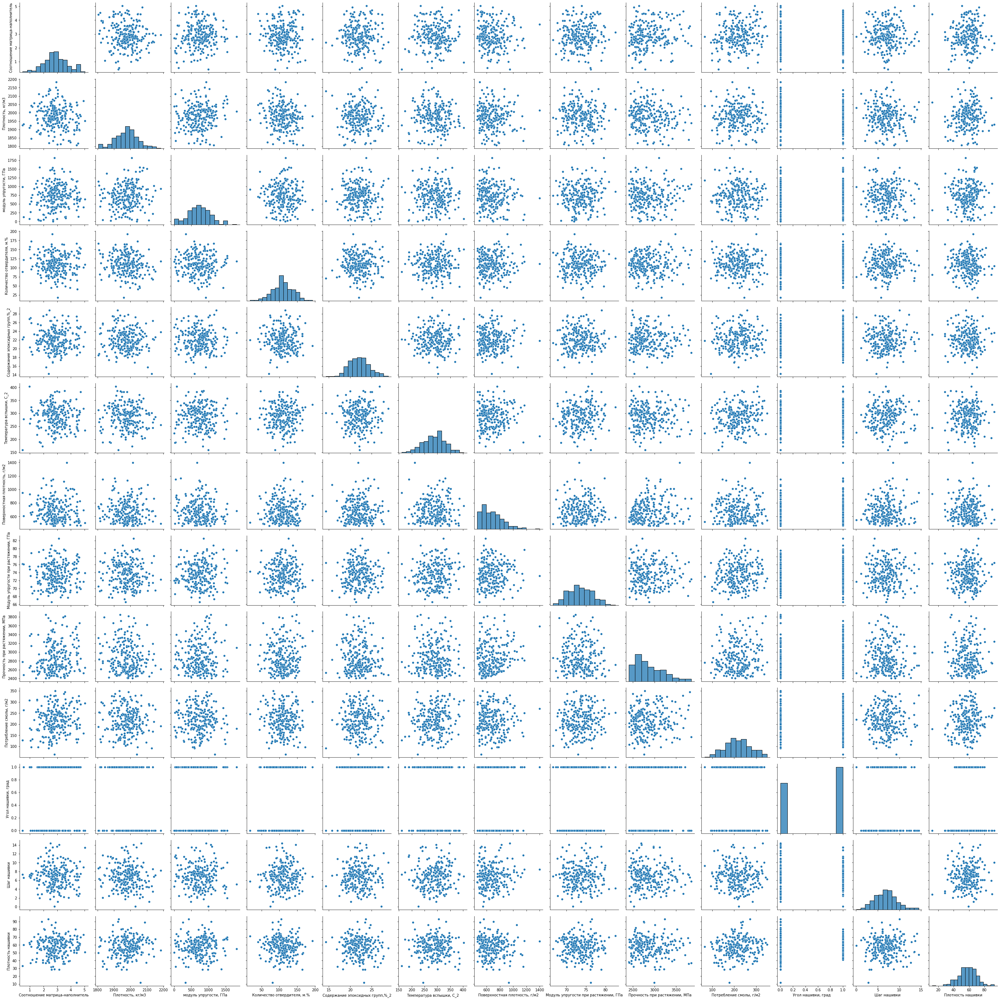

In [58]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_0, height=3)

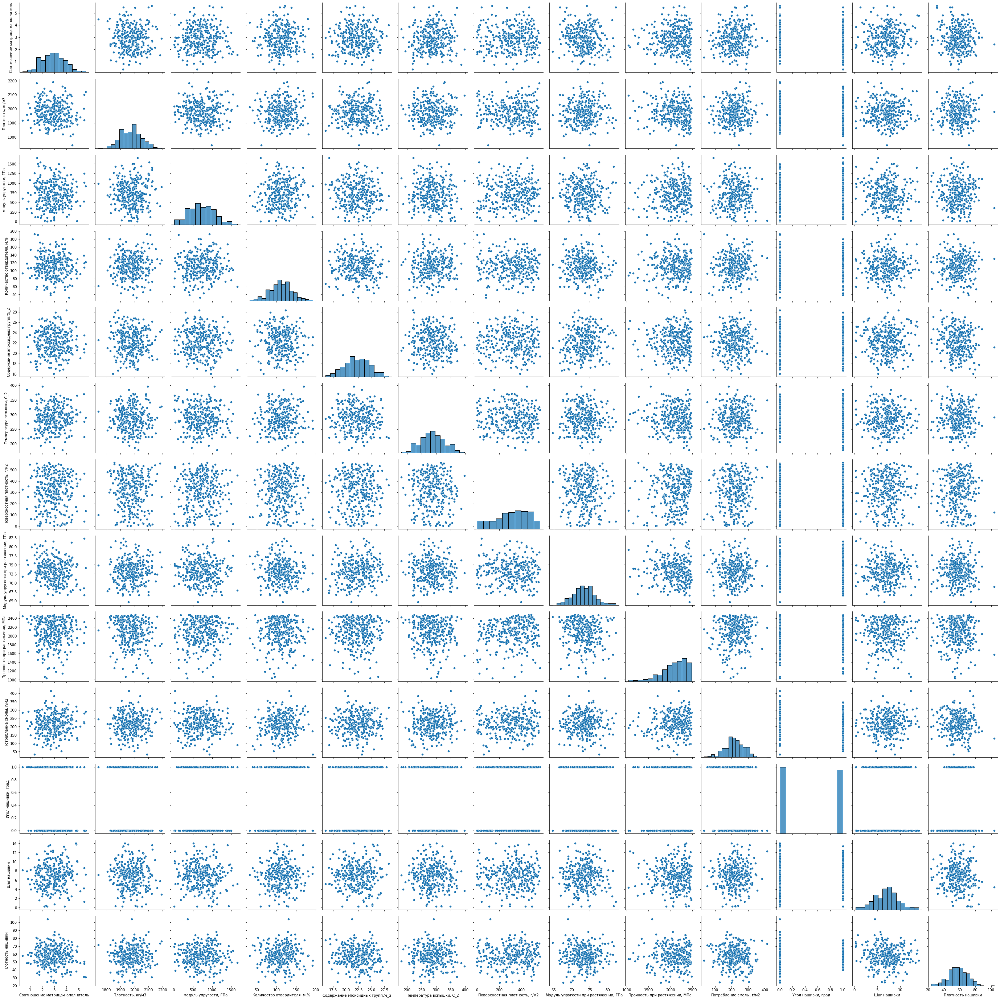

In [59]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_1, height=3)

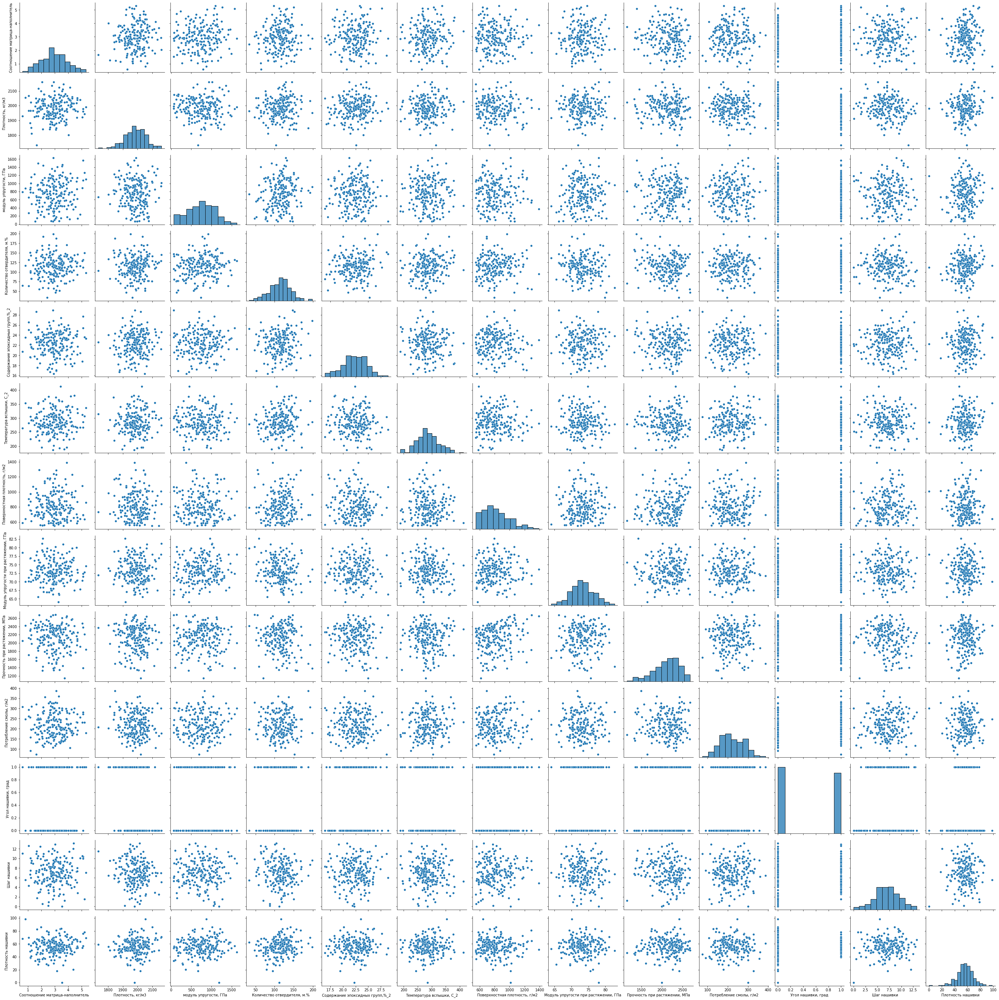

In [60]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_2, height=3)

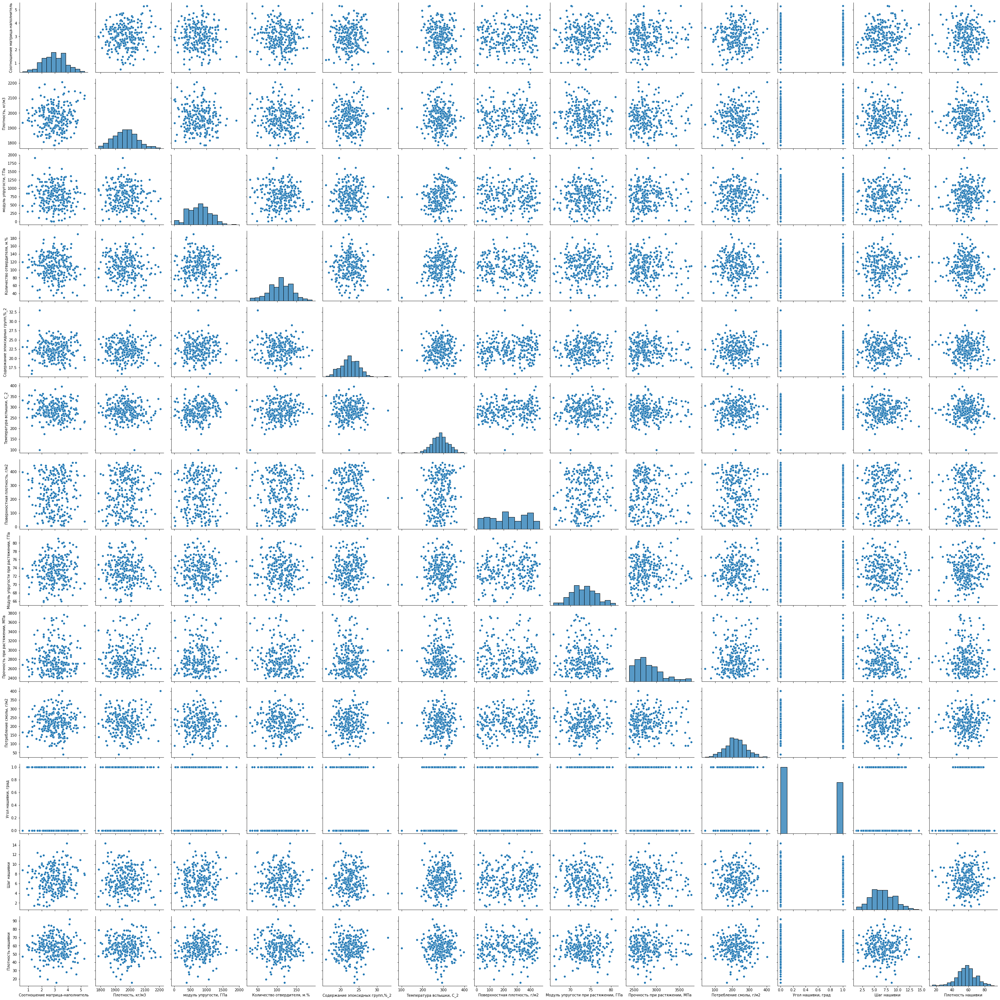

In [61]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_3, height=3)

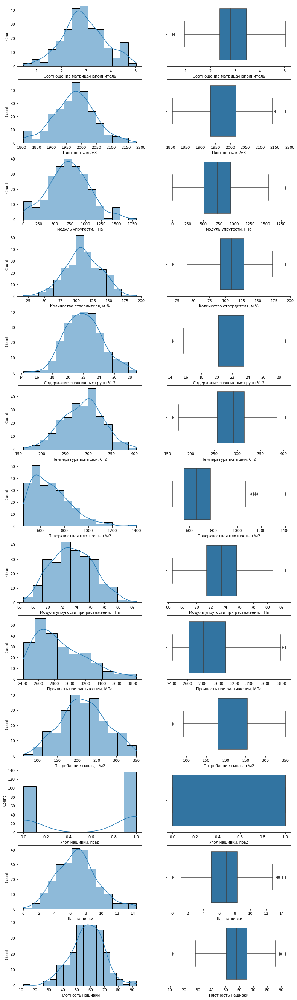

In [62]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_0.columns):    
    sns.histplot(data=ddf_0, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_0, x=column, ax=axes[k, 1])
plt.show()

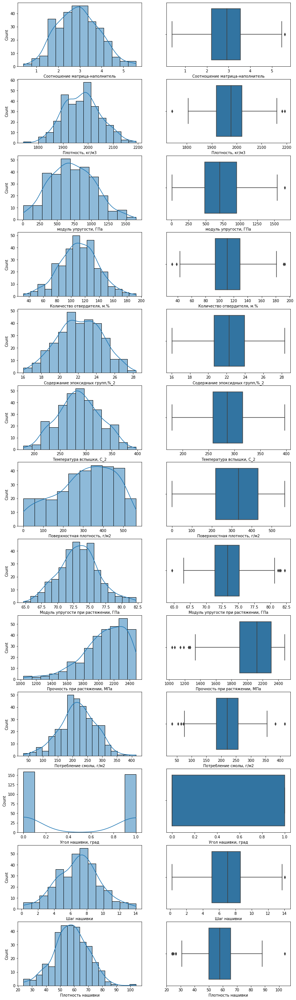

In [63]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_1.columns):    
    sns.histplot(data=ddf_1, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_1, x=column, ax=axes[k, 1])
plt.show()

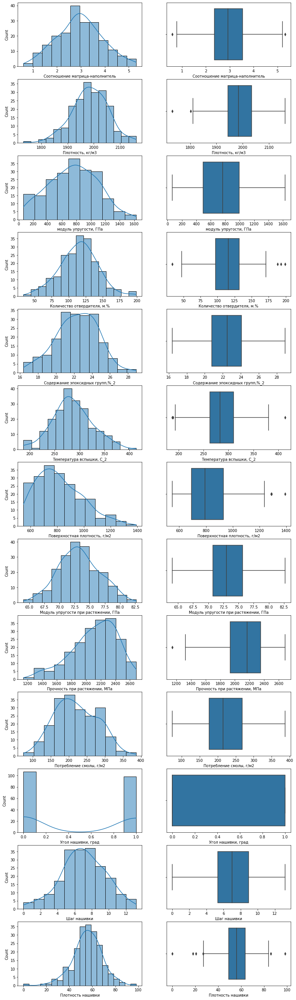

In [64]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_2.columns):    
    sns.histplot(data=ddf_2, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_2, x=column, ax=axes[k, 1])
plt.show()

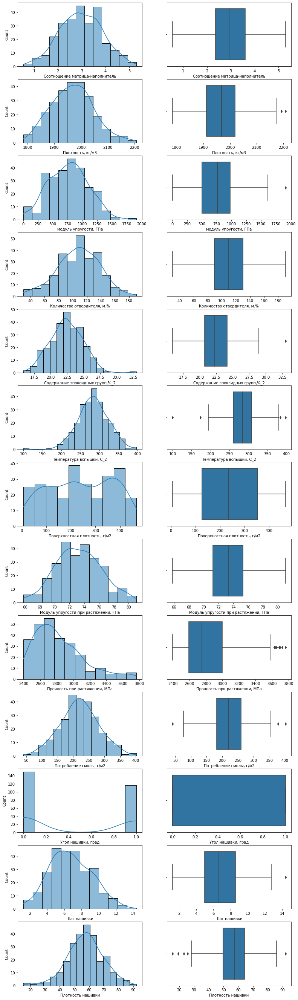

In [65]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_3.columns):    
    sns.histplot(data=ddf_3, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_3, x=column, ax=axes[k, 1])
plt.show()

In [66]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
ddf_0d=ddf_0[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [67]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
ddf_1d=ddf_1[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [68]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
ddf_2d=ddf_2[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [69]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
ddf_3d=ddf_3[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

### 3. Оценка корреляции параметров

Корреляция для количественных параметров и количественно-категориальных оценивается по критериям Пирсона и Спирмена соответственно

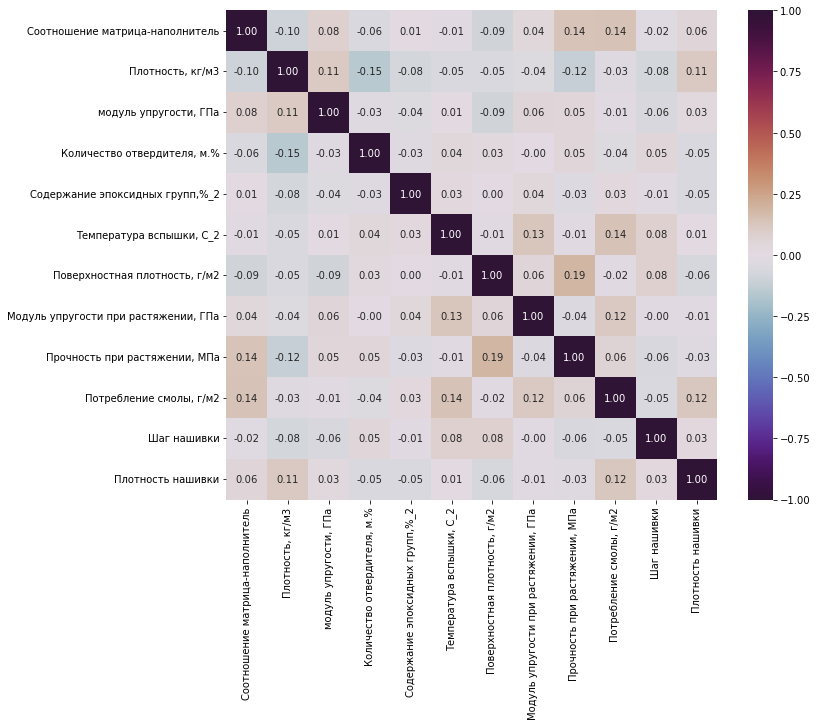

In [70]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_0d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

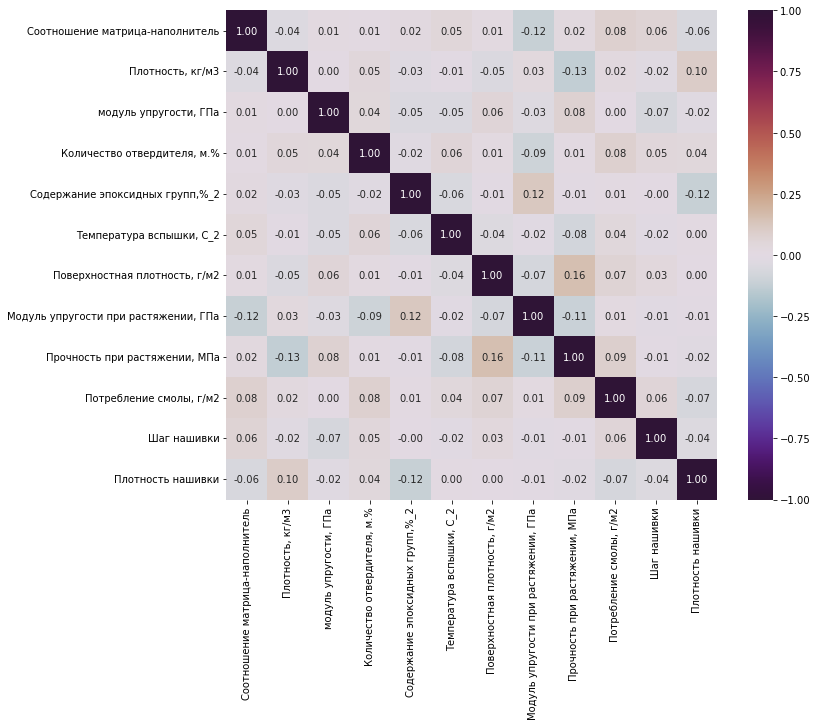

In [71]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_1d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

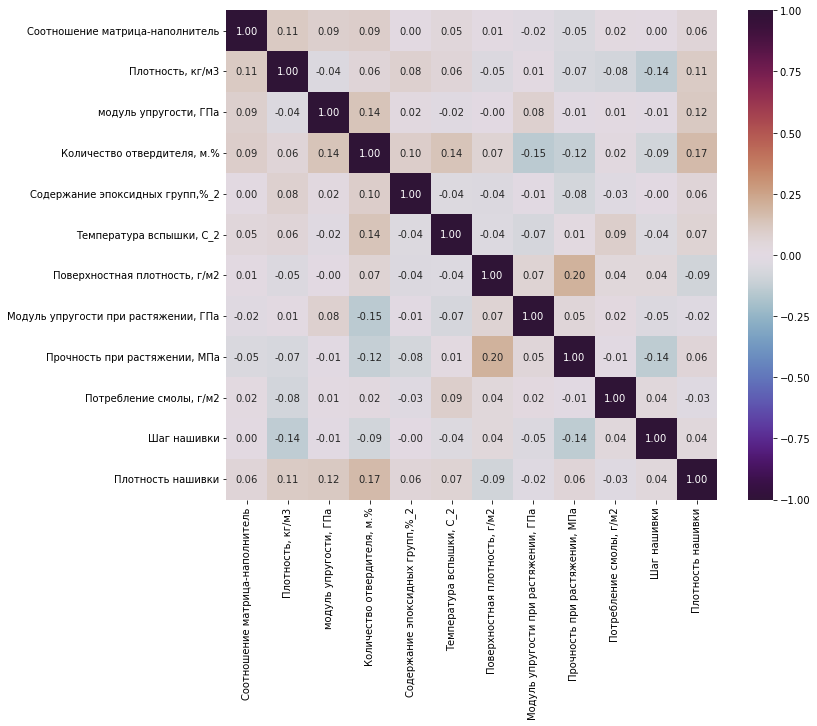

In [72]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_2d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

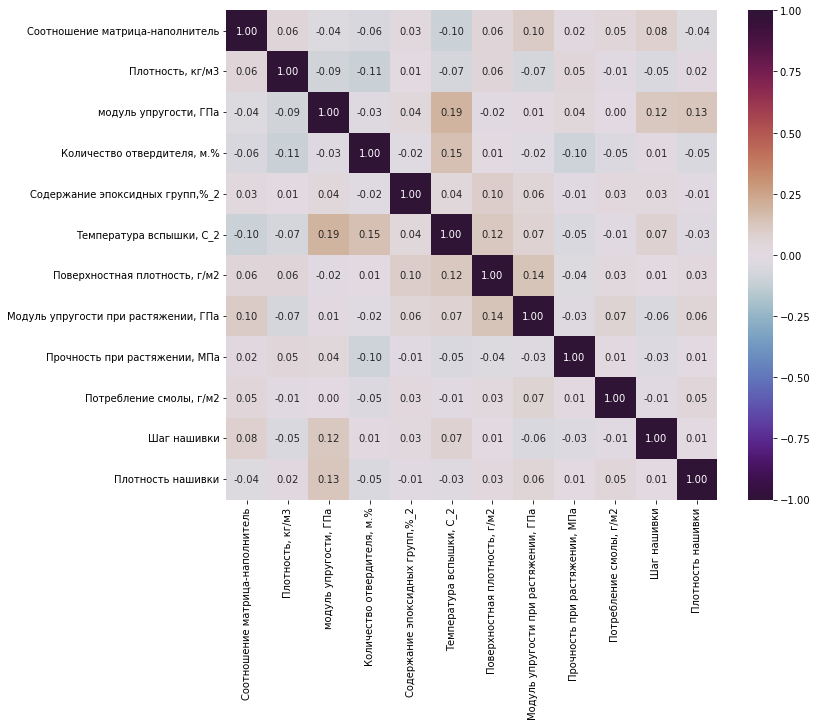

In [73]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_3d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

Вывод: коэффициент корреляции для параметров 'Прочность при растяжении, МПа' и 'Поверхностная плотность, г/м2' увеличился в трех группах примерно до 0,14 - 0,20

### 5. Построение моделей статистической регрессии

In [74]:
# Загрузка библиотек sklearn для проведения регрессионного анализа
import sklearn.linear_model as lm
import statsmodels.formula.api as smf

###### Анализ общей модели множественной регрессии

In [75]:
# Создание нового датасета ff для модели множественной регрессии
ff0 = ddf_0
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff0 = ff0.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff0.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,2.587348,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,80.803222,2587.342983,246.613117,1,4.0,70.0
1,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760,1,5.0,47.0
2,2.046471,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556,1,5.0,57.0
3,3.305535,1917.907506,478.286247,105.786930,17.874100,328.154579,526.692159,72.345709,3059.032991,275.575880,1,5.0,70.0
4,2.282825,2008.357592,393.967325,149.372832,21.661751,330.498641,535.371459,72.244924,2704.445081,261.077072,1,7.0,57.0


In [76]:
# Создание нового датасета ff для модели множественной регрессии
ff1 = ddf_1
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff1 = ff1.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff1.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,2.561475,1900.0,535.0,111.86,22.267857,284.615385,380.0,75.000000,1800.000000,120.0,0,7.0,47.0
1,3.557018,1930.0,889.0,129.00,21.250000,300.000000,380.0,75.000000,1800.000000,120.0,0,7.0,57.0
2,1.598174,1950.0,827.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,57.0
3,2.919678,1980.0,568.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,60.0
4,4.029126,1910.0,800.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,70.0


In [77]:
# Создание нового датасета ff для модели множественной регрессии
ff2 = ddf_2
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff2 = ff2.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff2.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,3.532338,2100.0,1421.0,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0,7.0,60.0
1,2.919678,2160.0,933.0,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0,7.0,70.0
2,2.877358,1990.0,1628.0,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0,9.0,47.0
3,3.532338,1980.0,1183.0,111.86,22.267857,284.615385,1010.0,78.0,2000.0,300.0,0,0.0,0.0
4,2.877358,2000.0,205.0,111.86,22.267857,284.615385,1010.0,78.0,2000.0,300.0,1,4.0,47.0


In [78]:
# Создание нового датасета ff для модели множественной регрессии
ff3 = ddf_3
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff3 = ff3.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff3.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [79]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff0 = pd.concat((ff0,pd.get_dummies(ff0.col11, prefix="col11", prefix_sep='',)),1)
ff0.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_17728\3663672012.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff0 = pd.concat((ff0,pd.get_dummies(ff0.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,2.587348,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,80.803222,2587.342983,246.613117,1,4.0,70.0,0,1
1,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760,1,5.0,47.0,0,1
2,2.046471,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556,1,5.0,57.0,0,1
3,3.305535,1917.907506,478.286247,105.786930,17.874100,328.154579,526.692159,72.345709,3059.032991,275.575880,1,5.0,70.0,0,1
4,2.282825,2008.357592,393.967325,149.372832,21.661751,330.498641,535.371459,72.244924,2704.445081,261.077072,1,7.0,57.0,0,1


In [80]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff1 = pd.concat((ff1,pd.get_dummies(ff1.col11, prefix="col11", prefix_sep='',)),1)
ff1.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_17728\2177107136.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff1 = pd.concat((ff1,pd.get_dummies(ff1.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,2.561475,1900.0,535.0,111.86,22.267857,284.615385,380.0,75.000000,1800.000000,120.0,0,7.0,47.0,1,0
1,3.557018,1930.0,889.0,129.00,21.250000,300.000000,380.0,75.000000,1800.000000,120.0,0,7.0,57.0,1,0
2,1.598174,1950.0,827.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,57.0,1,0
3,2.919678,1980.0,568.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,60.0,1,0
4,4.029126,1910.0,800.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,70.0,1,0


In [81]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff2 = pd.concat((ff2,pd.get_dummies(ff2.col11, prefix="col11", prefix_sep='',)),1)
ff2.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_17728\1420413336.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff2 = pd.concat((ff2,pd.get_dummies(ff2.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,3.532338,2100.0,1421.0,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0,7.0,60.0,1,0
1,2.919678,2160.0,933.0,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0,7.0,70.0,1,0
2,2.877358,1990.0,1628.0,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0,9.0,47.0,1,0
3,3.532338,1980.0,1183.0,111.86,22.267857,284.615385,1010.0,78.0,2000.0,300.0,0,0.0,0.0,1,0
4,2.877358,2000.0,205.0,111.86,22.267857,284.615385,1010.0,78.0,2000.0,300.0,1,4.0,47.0,0,1


In [82]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff3 = pd.concat((ff3,pd.get_dummies(ff3.col11, prefix="col11", prefix_sep='',)),1)
ff3.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_17728\347822830.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff3 = pd.concat((ff3,pd.get_dummies(ff3.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0,1,0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,1,0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0,1,0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,1,0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,1,0


In [83]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff0).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.046
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.9194
Date:                Sun, 09 Apr 2023   Prob (F-statistic):              0.528
Time:                        20:38:43   Log-Likelihood:                -597.52
No. Observations:                 241   AIC:                             1221.
Df Residuals:                     228   BIC:                             1266.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     73.4412      6.986     10.512      0.000      59.675      87.207
col1           0.1089      0.230      0.474      0.636      -0.344       0.561
col2          -0.0014      0.003     -0.497      0.620      -0.007       0.004
col3           0.0007      0.001      1.143      0.254      -0.000       0.002
col4          -0.0008      0.007     -0.108      0.914      -0.015       0.013
col5           0.0277      0.081      0.345      0.731      -0.131       0.186
col6           0.0073      0.004      1.626      0.105      -0.002       0.016
col7           0.0015      0.001      1.186      0.237      -0.001       0.004
col9          -0.0007      0.001     -1.125      0.262      -0.002       0.001
col10          0.0052      0.003      1.492      0.137      -0.002       0.012
col12         -0.0192      0.076     -0.253      0.801      -0.169       0.130
col13         -0.0056      0.017     -0.341      0.734      -0.038       0.027
col110        -0.4209      0.397     -1.061      0.290      -1.203       0.361
==============================================================================
Omnibus:                        2.087   Durbin-Watson:                   1.990
Prob(Omnibus):                  0.352   Jarque-Bera (JB):                1.917
Skew:                           0.126   Prob(JB):                        0.384
Kurtosis:                       2.643   Cond. No.                     1.34e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.34e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [84]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff1).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.053
Model:                            OLS   Adj. R-squared:                  0.014
Method:                 Least Squares   F-statistic:                     1.380
Date:                Sun, 09 Apr 2023   Prob (F-statistic):              0.174
Time:                        20:38:43   Log-Likelihood:                -782.38
No. Observations:                 311   AIC:                             1591.
Df Residuals:                     298   BIC:                             1639.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     73.2312      5.629     13.009      0.000      62.153      84.309
col1          -0.3818      0.185     -2.069      0.039      -0.745      -0.019
col2           0.0007      0.002      0.294      0.769      -0.004       0.005
col3          -0.0001      0.001     -0.223      0.824      -0.001       0.001
col4          -0.0102      0.006     -1.615      0.107      -0.023       0.002
col5           0.1502      0.073      2.051      0.041       0.006       0.294
col6          -0.0011      0.004     -0.242      0.809      -0.010       0.007
col7          -0.0011      0.001     -0.932      0.352      -0.004       0.001
col9          -0.0010      0.001     -1.657      0.099      -0.002       0.000
col10          0.0021      0.003      0.730      0.466      -0.004       0.008
col12         -0.0048      0.067     -0.071      0.943      -0.136       0.127
col13          0.0003      0.014      0.018      0.986      -0.028       0.029
col110         0.0245      0.354      0.069      0.945      -0.672       0.721
==============================================================================
Omnibus:                        2.475   Durbin-Watson:                   1.921
Prob(Omnibus):                  0.290   Jarque-Bera (JB):                2.181
Skew:                           0.185   Prob(JB):                        0.336
Kurtosis:                       3.177   Cond. No.                     9.75e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.75e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [85]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff2).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.046
Model:                            OLS   Adj. R-squared:                 -0.014
Method:                 Least Squares   F-statistic:                    0.7664
Date:                Sun, 09 Apr 2023   Prob (F-statistic):              0.684
Time:                        20:38:43   Log-Likelihood:                -537.28
No. Observations:                 205   AIC:                             1101.
Df Residuals:                     192   BIC:                             1144.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     72.0545      8.100      8.896      0.000      56.078      88.031
col1          -0.0581      0.261     -0.223      0.824      -0.573       0.457
col2           0.0013      0.004      0.364      0.716      -0.006       0.009
col3           0.0010      0.001      1.445      0.150      -0.000       0.002
col4          -0.0202      0.009     -2.191      0.030      -0.038      -0.002
col5           0.0067      0.104      0.064      0.949      -0.199       0.212
col6          -0.0039      0.006     -0.638      0.524      -0.016       0.008
col7           0.0016      0.001      1.096      0.274      -0.001       0.004
col9           0.0001      0.001      0.157      0.875      -0.001       0.002
col10          0.0014      0.004      0.340      0.734      -0.007       0.010
col12         -0.0782      0.096     -0.819      0.414      -0.267       0.110
col13      -3.511e-05      0.019     -0.002      0.999      -0.038       0.038
col110        -0.1577      0.506     -0.312      0.756      -1.156       0.840
==============================================================================
Omnibus:                        2.472   Durbin-Watson:                   1.772
Prob(Omnibus):                  0.291   Jarque-Bera (JB):                2.177
Skew:                           0.151   Prob(JB):                        0.337
Kurtosis:                       2.595   Cond. No.                     1.06e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.06e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [86]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff3).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.056
Model:                            OLS   Adj. R-squared:                  0.011
Method:                 Least Squares   F-statistic:                     1.254
Date:                Sun, 09 Apr 2023   Prob (F-statistic):              0.247
Time:                        20:38:43   Log-Likelihood:                -667.84
No. Observations:                 266   AIC:                             1362.
Df Residuals:                     253   BIC:                             1408.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     75.3752      5.747     13.115      0.000      64.057      86.694
col1           0.3933      0.216      1.825      0.069      -0.031       0.818
col2          -0.0034      0.002     -1.435      0.153      -0.008       0.001
col3       -2.061e-05      0.001     -0.035      0.972      -0.001       0.001
col4          -0.0032      0.007     -0.497      0.619      -0.016       0.010
col5           0.0568      0.077      0.736      0.462      -0.095       0.209
col6           0.0058      0.005      1.175      0.241      -0.004       0.016
col7           0.0028      0.001      1.904      0.058   -9.61e-05       0.006
col9          -0.0002      0.001     -0.357      0.722      -0.001       0.001
col10          0.0028      0.003      0.901      0.369      -0.003       0.009
col12         -0.0990      0.078     -1.272      0.205      -0.252       0.054
col13          0.0158      0.016      1.000      0.318      -0.015       0.047
col110         0.0630      0.387      0.163      0.871      -0.699       0.825
==============================================================================
Omnibus:                        1.175   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.556   Jarque-Bera (JB):                1.131
Skew:                           0.006   Prob(JB):                        0.568
Kurtosis:                       2.681   Cond. No.                     1.09e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.09e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Вывод: модели незначимы, R-squared несколько возрос - до 0,046; все параметры не значимы